In [2]:
!pip install pytesseract
!apt-get install tesseract-ocr
!apt-get install libtesseract-dev


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 45 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 2s (2,849 kB/s)
Selecting previously unselected package tesseract-ocr-eng.
(Reading database ... 121918 files and directories currently installed.)
Preparing to unpack .../tesseract-ocr-

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pytesseract
import os
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import average_precision_score

# **Preprocessing**

In [4]:
def preprocess_image(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    resized_image = cv2.resize(gray_image, (256, 256))
    normalized_image = resized_image / 255.0
    return normalized_image


# **Data Augmentation**

In [5]:
def rotate_image(image, angle):
    height, width = image.shape[:2]
    rotation_matrix = cv2.getRotationMatrix2D((width / 2, height / 2), angle, 1)
    rotated_image = cv2.warpAffine(image, rotation_matrix, (width, height))
    return rotated_image

In [6]:
def translate_image(image, x, y):
    translation_matrix = np.float32([[1, 0, x], [0, 1, y]])
    translated_image = cv2.warpAffine(image, translation_matrix, (image.shape[1], image.shape[0]))
    return translated_image

In [7]:
def scale_image(image, scale_factor):
    # Apply scaling to the image
    scaled_image = cv2.resize(image, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
    return scaled_image


In [8]:
def flip_image(image, flip_code):
    # Flip the image
    flipped_image = cv2.flip(image, flip_code)
    return flipped_image


In [9]:
# Hàm đọc nhãn từ file
def read_labels(label_path):
    with open(label_path, 'r') as file:
        lines = file.readlines()
        labels = [list(map(float, line.strip().split())) for line in lines]
    return labels

# Hàm vẽ bounding box cho các ký tự trên ảnh
def draw_boxes(image, labels):
    image_with_boxes = image.copy()
    image_height, image_width = image.shape[:2]  # Fix the unpacking error

    for label in labels:
        class_id, x_center, y_center, width, height = label

        # Chuyển đổi tọa độ tương đối thành tọa độ tuyệt đối
        x1 = int((x_center - width / 2) * image_width)
        y1 = int((y_center - height / 2) * image_height)
        x2 = int((x_center + width / 2) * image_width)
        y2 = int((y_center + height / 2) * image_height)

        # Vẽ bounding box lên ảnh
        cv2.rectangle(image_with_boxes, (x1, y1), (x2, y2), (255,0, 0), 1)

    return image_with_boxes

# Chuyển đổi ảnh sang kiểu uint8 nếu cần thiết
def convert_to_uint8(image):
    if image.dtype != 'uint8':
        image = (image * 255).astype('uint8')
    return image

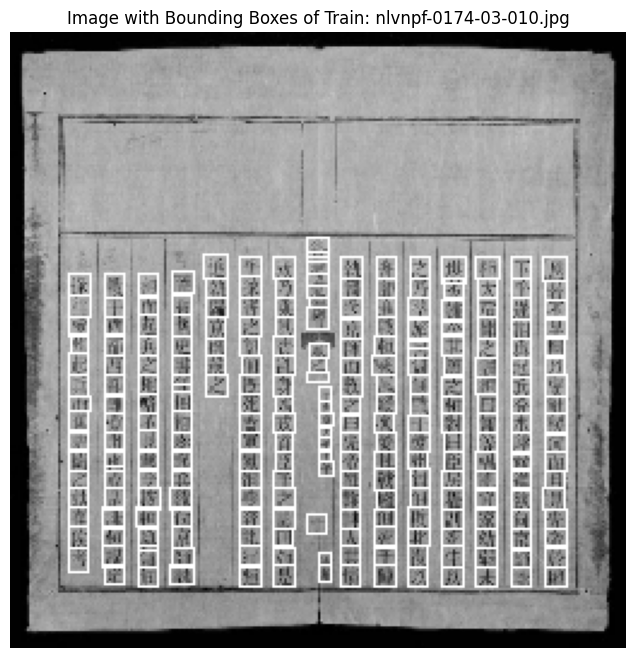

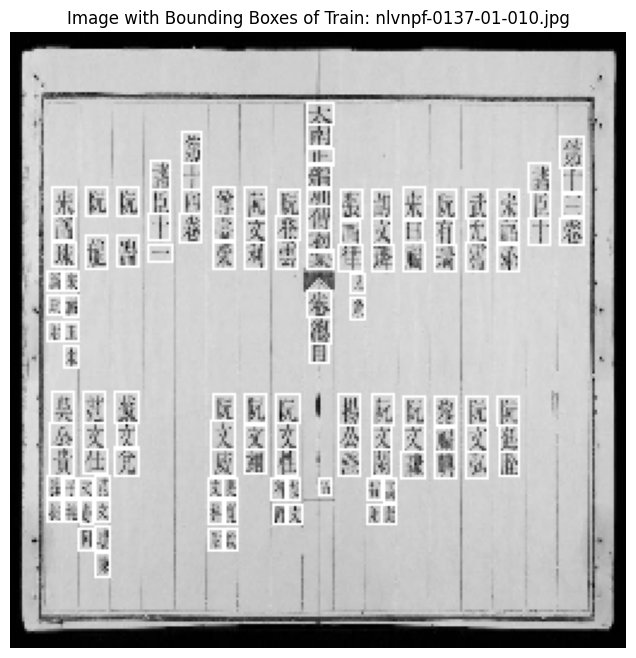

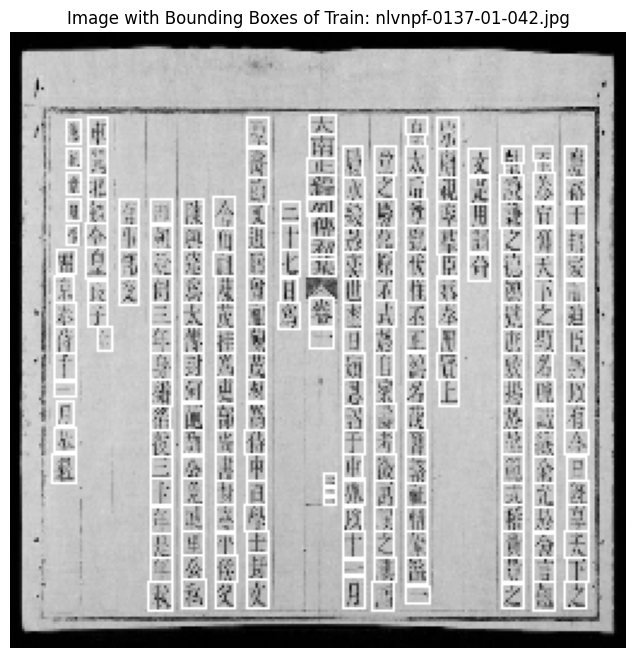

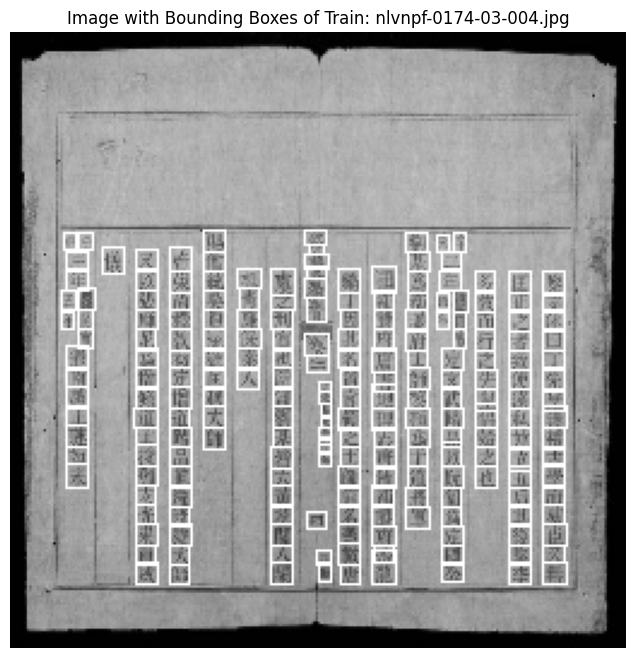

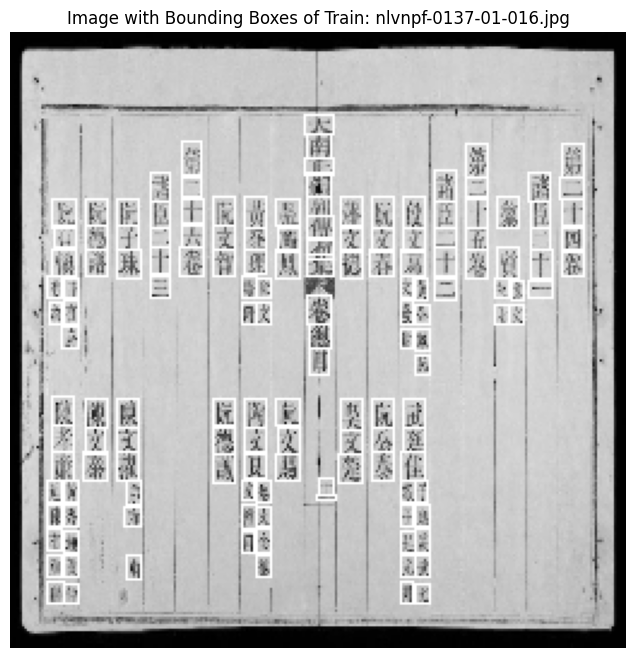

...

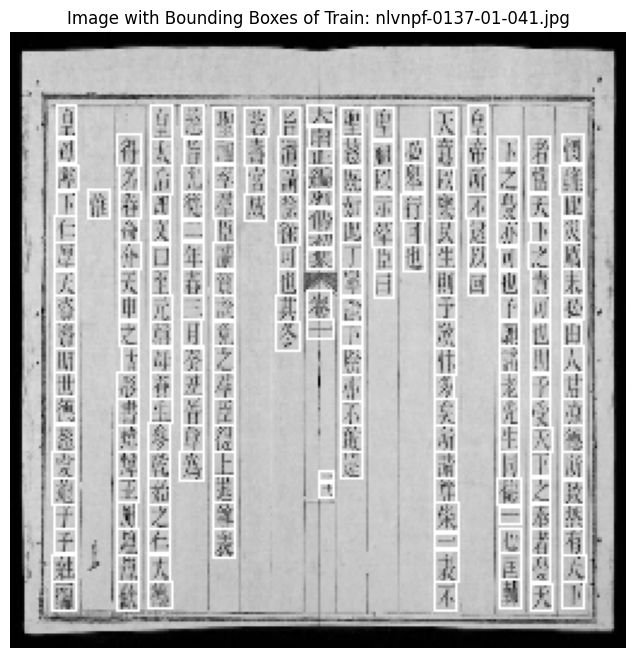

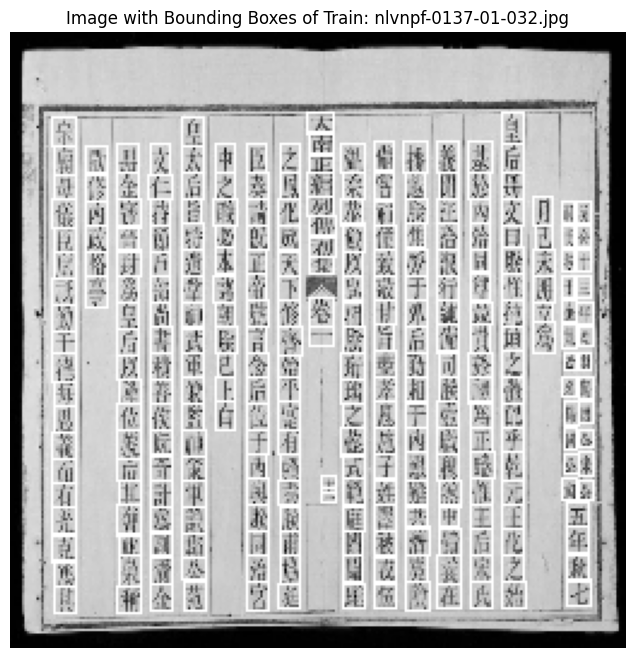

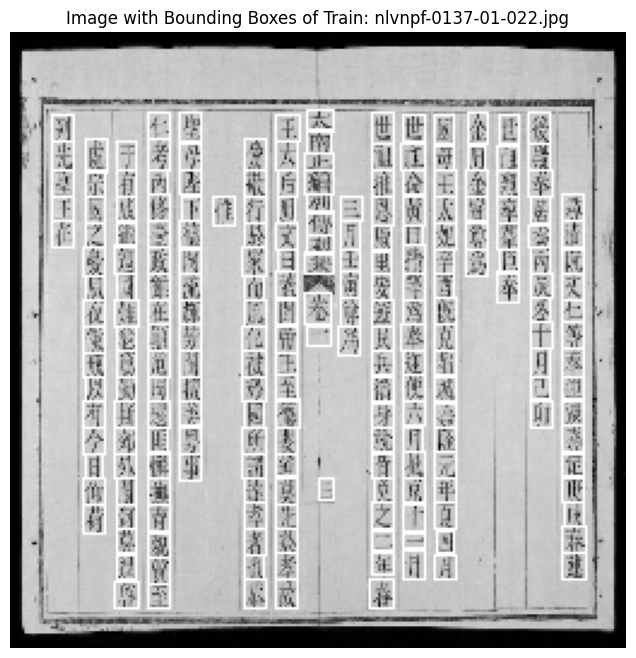

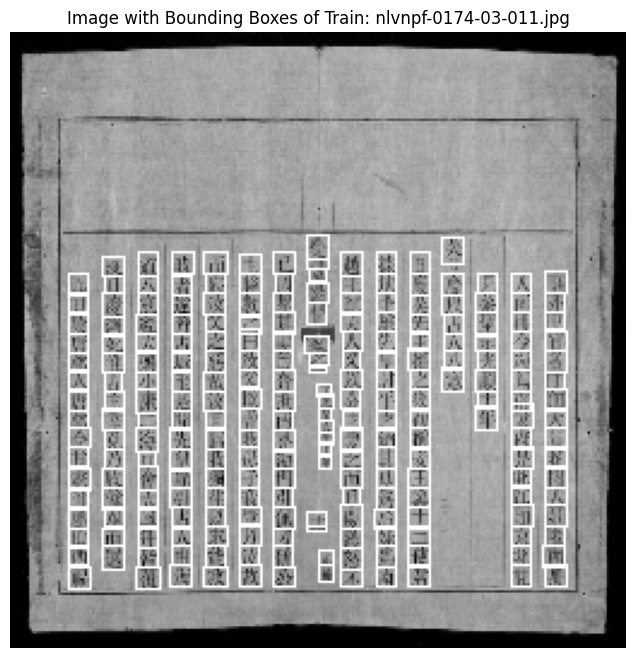

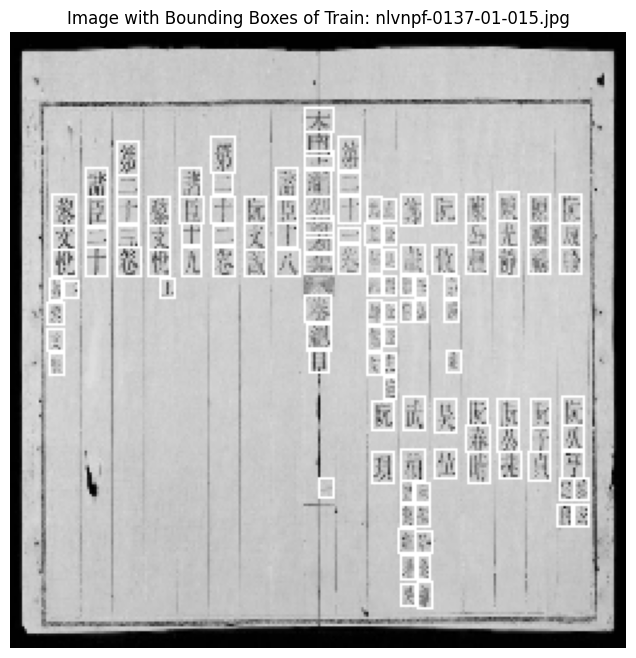

In [ ]:
# Đường dẫn tới thư mục
train_dir = '/content/drive/MyDrive/Xla/wb_localization_dataset/images/train'
train_label_dir = '/content/drive/MyDrive/Xla/wb_localization_dataset/labels/train'
val_dir = '/content/drive/MyDrive/Xla/wb_localization_dataset/images/val'
val_label_dir = '/content/drive/MyDrive/Xla/wb_localization_dataset/labels/val'

# Tiền xử lý và tăng cường dữ liệu cho tập huấn luyện
train_images = []
train_labels = []

for image_file in os.listdir(train_dir):
    image_path = os.path.join(train_dir, image_file)
    label_path = os.path.join(train_label_dir, f"{os.path.splitext(image_file)[0]}.txt")
    image = cv2.imread(image_path)
    preprocessed_image = preprocess_image(image)

    # Default values for image_with_boxes and labels
    image_with_boxes = image
    labels = []

    # Kiểm tra file nhãn có tồn tại không
    if os.path.exists(label_path):

            # Tiền xử lý ảnh (nếu cần)
            image = convert_to_uint8(preprocessed_image)

            # Đọc nhãn
            labels = read_labels(label_path)

            # Vẽ bounding box trên ảnh
            image_with_boxes = draw_boxes(image, labels)

            # Hiển thị ảnh với bounding box
            plt.figure(figsize=(10, 8))
            plt.imshow(cv2.cvtColor(image_with_boxes, cv2.COLOR_BGR2RGB))
            plt.title(f"Image with Bounding Boxes of Train: {image_file}")
            plt.axis('off')
            plt.show()

    train_images.append(image_with_boxes)
    train_labels.append(labels)

# Tiền xử lý và tăng cường dữ liệu cho tập validation
val_images = []
val_labels = []

for image_file in os.listdir(val_dir):
    image_path = os.path.join(val_dir, image_file)
    label_path = os.path.join(val_label_dir, f"{os.path.splitext(image_file)[0]}.txt")
    image = cv2.imread(image_path)
    preprocessed_image = preprocess_image(image)

     # Default values for image_with_boxes and labels
    image_with_boxes = image
    labels = []

     # Kiểm tra file nhãn có tồn tại không
    if os.path.exists(label_path):

            # Tiền xử lý ảnh (nếu cần)
            image = convert_to_uint8(preprocessed_image)

            # Đọc nhãn
            labels = read_labels(label_path)

            # Vẽ bounding box trên ảnh
            image_with_boxes = draw_boxes(image, labels)

            # Hiển thị ảnh với bounding box
            plt.figure(figsize=(10, 8))
            plt.imshow(cv2.cvtColor(image_with_boxes, cv2.COLOR_BGR2RGB))
            plt.title(f"Image with Bounding Boxes of Val: {image_file}")
            plt.axis('off')
            plt.show()

    val_images.append(image_with_boxes)
    val_labels.append(labels)




In [11]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [12]:
# Chuyển danh sách thành numpy array nếu cần (ví dụ: để huấn luyện với TensorFlow/PyTorch)
#train_images = np.array(train_images)
#val_images = np.array(val_images)


In [13]:
print("Số lượng ảnh trong tập huấn luyện:", len(train_images))
print("Số lượng ảnh trong tập validation:", len(val_images))


Số lượng ảnh trong tập huấn luyện: 0


NameError: name 'val_images' is not defined

# **Metrics**